<a href="https://colab.research.google.com/github/woen3150/DL_study/blob/main/rock_paper_scissors.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 가위-바위-보 데이터 학습하기

## 데이터 가져오기

#### 데이터를 로컬 컴퓨터로 다운로드

- 드라이브 내의 데이터 가져오기

In [ ]:
!unzip '/content/drive/MyDrive/RSP_project/Rock Paper Scissors.v1-raw-300x300.folder.zip' -d .'/Rock-Paper-Scissors-1/'

Archive:  /content/drive/MyDrive/RSP_project/Rock Paper Scissors.v1-raw-300x300.folder.zip
 extracting: ./Rock-Paper-Scissors-1/train/paper/paper04-052_png.rf.004703ee1216ced61a16362f8f5fe00d.jpg  
 extracting: ./Rock-Paper-Scissors-1/train/scissors/testscissors03-004_png.rf.004126168fdf6dfb8e9a7ba3c08f9844.jpg  
 extracting: ./Rock-Paper-Scissors-1/train/rock/rock06ck02-078_png.rf.00528e3021df058844b2acd5bcb8377d.jpg  
 extracting: ./Rock-Paper-Scissors-1/train/paper/paper05-001_png.rf.003974baed8eb821dd1adad162f47ee8.jpg  
 extracting: ./Rock-Paper-Scissors-1/valid/scissors/testscissors01-09_png.rf.002a246b771d80a2a4bbcdeca21bd207.jpg  
 extracting: ./Rock-Paper-Scissors-1/train/rock/rock01-092_png.rf.00cceb5a6cf4c94ea3ec6a92c2da0f4a.jpg  
 extracting: ./Rock-Paper-Scissors-1/valid/scissors/testscissors02-01_png.rf.002d84355c8a79629e765cae28bbf9a2.jpg  
 extracting: ./Rock-Paper-Scissors-1/train/scissors/scissors03-119_png.rf.00c279379bd790427f39b9fd471d59f1.jpg  
 extracting: ./Rock

#### 데이터를 코드로 다운로드

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="mzESNWavoPEcwAX2nIlX")
project = rf.workspace("joseph-nelson").project("rock-paper-scissors")
dataset = project.version(1).download("folder")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 48.5/48.5 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 39.3 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9656 sha256=be27f009e61a44dbf6c1b3ca81282c27597f05ec29b609f9ea2e7bedaea87751
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.0
    Uninstalling pyparsing-3.1.0:
      Su

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Rock-Paper-Scissors-1 in folder:: 100%|██████████| 2927/2927 [00:00<00:00, 9982.44it/s]


## Tensorflow로 학습해보기

### 데이터 전처리하기

In [ ]:
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow as tf
import tensorflow_datasets as tfds
import pathlib

- 데이터 경로 지정 및 개수 확인하기

In [ ]:
train_data_dir = pathlib.Path('/content/Rock-Paper-Scissors-1/train/')
image_count = len(list(train_data_dir.glob('*/*.jpg')))
print(image_count)

2520


In [ ]:
valid_data_dir = pathlib.Path('/content/Rock-Paper-Scissors-1/valid/')
image_count = len(list(valid_data_dir.glob('*/*.jpg')))
print(image_count)

372


- 예제 데이터 살펴보기

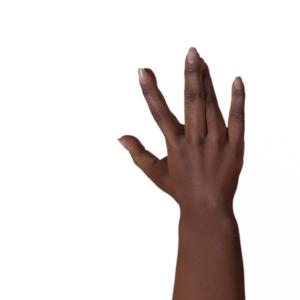

In [ ]:
paper = list(train_data_dir.glob('paper/*'))
PIL.Image.open(str(paper[0]))

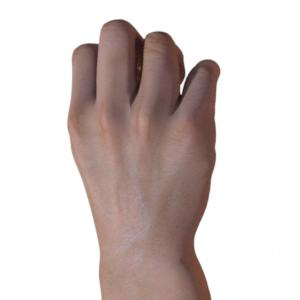

In [ ]:
rock = list(train_data_dir.glob('rock/*'))
PIL.Image.open(str(rock[0]))

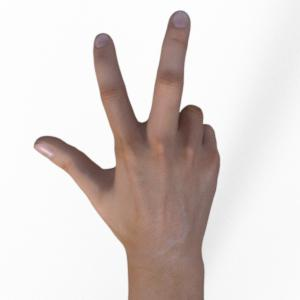

In [ ]:
scissors = list(train_data_dir.glob('scissors/*'))
PIL.Image.open(str(scissors[0]))

### Keras 유틸리티를 사용하여 데이터 로드

- batch_size, 이미지 크기 지정

In [ ]:
batch_size = 32
img_height = 180
img_width = 180

- training 데이터 셋 만들기

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_data_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 2520 files belonging to 3 classes.


- validation 데이터 셋 만들기

In [ ]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  valid_data_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 372 files belonging to 3 classes.


- class 이름 지정하기

In [ ]:
class_names = train_ds.class_names
print(class_names)

['paper', 'rock', 'scissors']


- 데이터 시각화하기

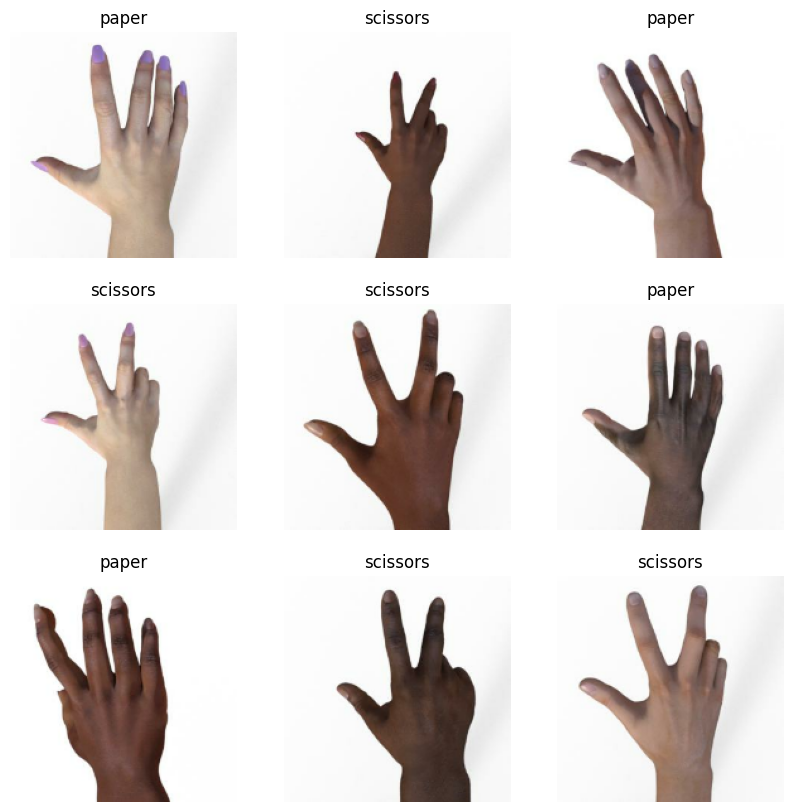

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

- shape 확인하기

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(32, 180, 180, 3)
(32,)


### Tensorflow로 모델 만들기

- 필요한 모듈들 import 하기

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

- 데이터 세트 구성하기

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

- 데이터 표준화하기

In [ ]:
normalization_layer = layers.Rescaling(1./255)

In [ ]:
normalized_ds = train_ds.map(lambda x, y: (normalization_layer(x), y))
image_batch, labels_batch = next(iter(normalized_ds))
first_image = image_batch[0]
# Notice the pixel values are now in `[0,1]`.
print(np.min(first_image), np.max(first_image))

0.07320261 1.0


- 모델 만들기

In [ ]:
num_classes = len(class_names)

model = Sequential([
  layers.Rescaling(1./255, input_shape=(img_height, img_width, 3)),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes)
])

- 모델 컴파일하기

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 90, 90, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 45, 45, 64)        1

- 학습하기

In [ ]:
epochs=10
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/10
79/79 [==============================] - 16s 29ms/step - loss: 0.8415 - accuracy: 0.6790 - val_loss: 0.4139 - val_accuracy: 0.8575
Epoch 2/10
79/79 [==============================] - 1s 19ms/step - loss: 0.0682 - accuracy: 0.9861 - val_loss: 0.3918 - val_accuracy: 0.8656
Epoch 3/10
79/79 [==============================] - 1s 19ms/step - loss: 0.0123 - accuracy: 0.9968 - val_loss: 0.5091 - val_accuracy: 0.8387
Epoch 4/10
79/79 [==============================] - 1s 19ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.5380 - val_accuracy: 0.8602
Epoch 5/10
79/79 [==============================] - 1s 19ms/step - loss: 5.1040e-04 - accuracy: 1.0000 - val_loss: 0.5757 - val_accuracy: 0.8656
Epoch 6/10
79/79 [==============================] - 1s 19ms/step - loss: 2.2512e-04 - accuracy: 1.0000 - val_loss: 0.6412 - val_accuracy: 0.8629
Epoch 7/10
79/79 [==============================] - 1s 19ms/step - loss: 1.9388e-04 - accuracy: 1.0000 - val_loss: 0.6205 - val_accuracy: 0.8656


### 학습 결과 확인하기

- 결과 살펴보기

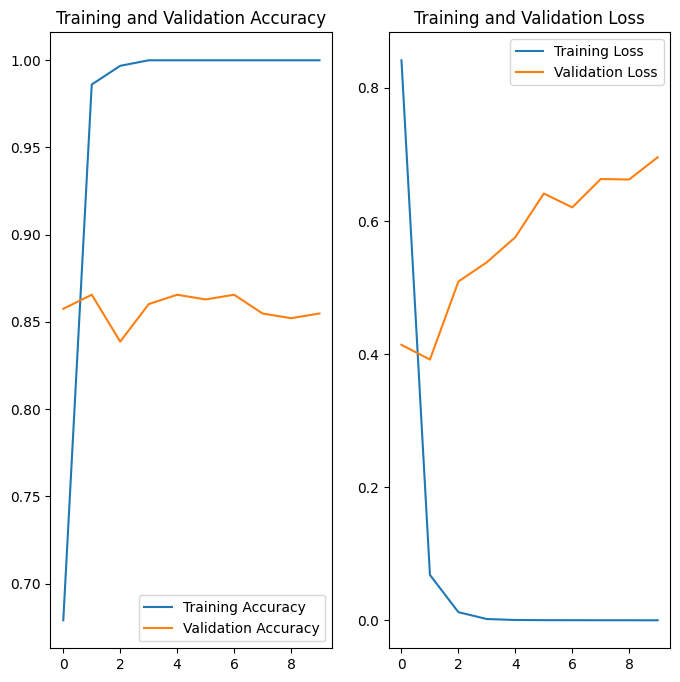

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

- 새로운 데이터로 모델 성능 확인하기

In [ ]:
img = tf.keras.utils.load_img(
    './Rock-Paper-Scissors-1/test/scissors/scissors2_png.rf.2746f658ddbe0b240dd3f3d7f4926c01.jpg',
    target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions)

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

1/1 [==============================] - 0s 183ms/step
This image most likely belongs to paper with a 98.35 percent confidence.


In [ ]:
predictions

array([[ 8.182043 , -3.1971889,  4.0936437]], dtype=float32)

In [ ]:
score

<tf.Tensor: shape=(1, 3), dtype=float32, numpy=array([[9.8349935e-01, 1.1241809e-05, 1.6489396e-02]], dtype=float32)>

Text(0.5, 1.0, 'paper(98.35%)')

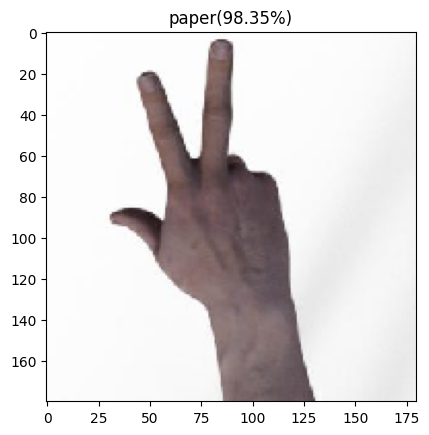

In [ ]:
plt.imshow(img)
plt.title(class_names[np.argmax(score)]+'('+str(round((100 * np.max(score)),2))+'%)')

1/1 [==============================] - 0s 19ms/step


Text(0.5, 1.0, 'rock(99.7%)')

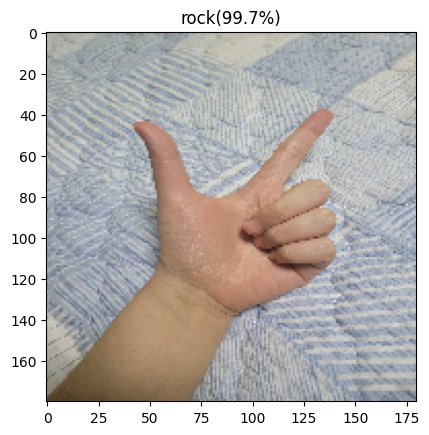

In [ ]:
img = tf.keras.utils.load_img(
    '/content/1.jpg', target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

plt.imshow(img)
plt.title(class_names[np.argmax(score)]+'('+str(round((100 * np.max(score)),2))+'%)')

1/1 [==============================] - 0s 21ms/step


Text(0.5, 1.0, 'paper(99.93%)')

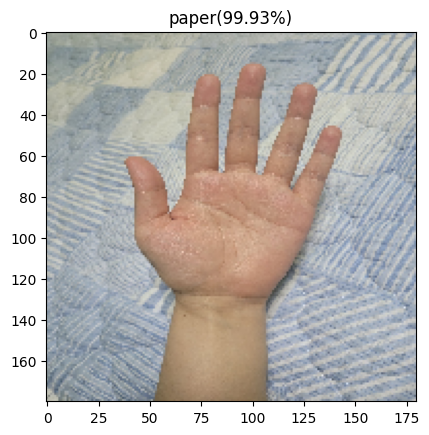

In [ ]:
img = tf.keras.utils.load_img(
    '/content/2.jpg', target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

plt.imshow(img)
plt.title(class_names[np.argmax(score)]+'('+str(round((100 * np.max(score)),2))+'%)')

1/1 [==============================] - 0s 18ms/step


Text(0.5, 1.0, 'paper(66.49%)')

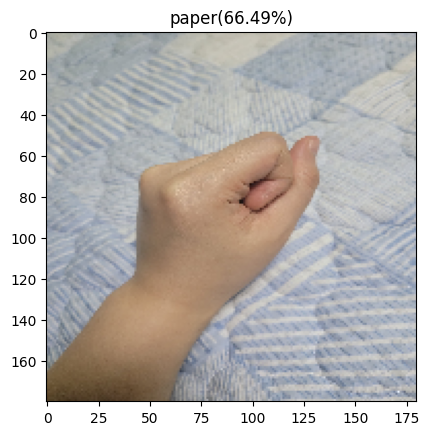

In [ ]:
img = tf.keras.utils.load_img(
    '/content/3.jpg', target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

plt.imshow(img)
plt.title(class_names[np.argmax(score)]+'('+str(round((100 * np.max(score)),2))+'%)')

### Data augmentation

In [ ]:
data_augmentation = keras.Sequential(
  [layers.RandomFlip("horizontal",
                      input_shape=(img_height,
                                  img_width,
                                  3)),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
  ]
)

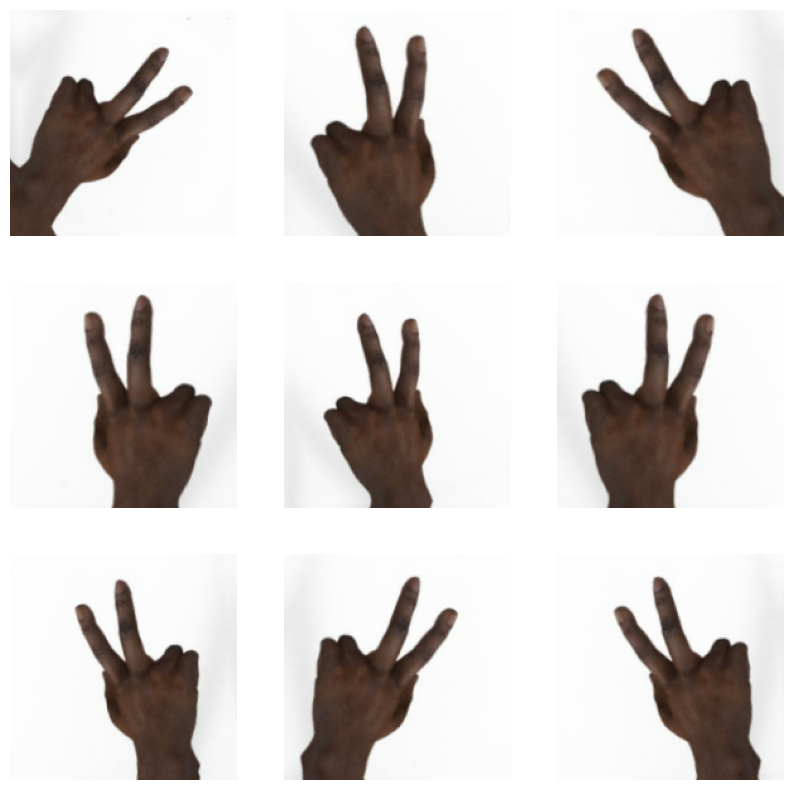

In [ ]:
plt.figure(figsize=(10, 10))
for images, _ in train_ds.take(1):
  for i in range(9):
    augmented_images = data_augmentation(images)
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(augmented_images[0].numpy().astype("uint8"))
    plt.axis("off")

- 모델 만들기

In [ ]:
model = Sequential([
  data_augmentation,
  layers.Rescaling(1./255),
  layers.Conv2D(16, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(32, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, padding='same', activation='relu'),
  layers.MaxPooling2D(),
  layers.Dropout(0.2),
  layers.Flatten(),
  layers.Dense(128, activation='relu'),
  layers.Dense(num_classes, name="outputs")
])

- 모델 컴파일 하기

In [ ]:
model.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential_1 (Sequential)   (None, 180, 180, 3)       0         
                                                                 
 rescaling_2 (Rescaling)     (None, 180, 180, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 180, 180, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPooling  (None, 90, 90, 16)       0         
 2D)                                                             
                                                                 
 conv2d_4 (Conv2D)           (None, 90, 90, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPooling  (None, 45, 45, 32)       0         
 2D)                                                  

In [ ]:
epochs = 15
history = model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs
)

Epoch 1/15
79/79 [==============================] - 5s 29ms/step - loss: 0.6004 - accuracy: 0.7238 - val_loss: 0.5081 - val_accuracy: 0.7742
Epoch 2/15
79/79 [==============================] - 2s 26ms/step - loss: 0.1775 - accuracy: 0.9429 - val_loss: 0.2576 - val_accuracy: 0.8898
Epoch 3/15
79/79 [==============================] - 2s 26ms/step - loss: 0.0812 - accuracy: 0.9790 - val_loss: 0.7138 - val_accuracy: 0.8360
Epoch 4/15
79/79 [==============================] - 2s 26ms/step - loss: 0.0552 - accuracy: 0.9841 - val_loss: 0.5069 - val_accuracy: 0.8871
Epoch 5/15
79/79 [==============================] - 2s 26ms/step - loss: 0.0506 - accuracy: 0.9841 - val_loss: 0.1600 - val_accuracy: 0.9462
Epoch 6/15
79/79 [==============================] - 2s 27ms/step - loss: 0.0276 - accuracy: 0.9897 - val_loss: 0.1864 - val_accuracy: 0.9409
Epoch 7/15
79/79 [==============================] - 2s 28ms/step - loss: 0.0242 - accuracy: 0.9925 - val_loss: 0.0656 - val_accuracy: 0.9812
Epoch 8/15
79

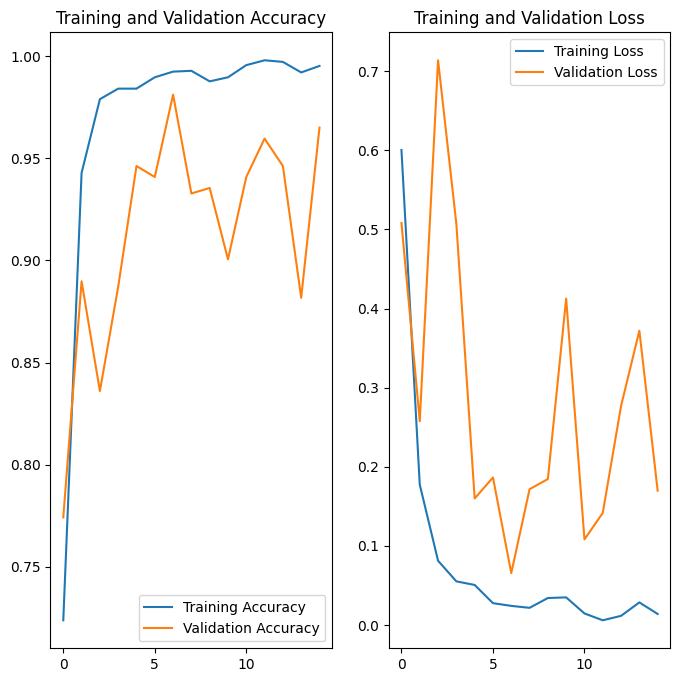

In [ ]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [ ]:
img = tf.keras.utils.load_img(
    './Rock-Paper-Scissors-1/test/scissors/scissors2_png.rf.2746f658ddbe0b240dd3f3d7f4926c01.jpg',
    target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(class_names[np.argmax(score)], 100 * np.max(score))
)

1/1 [==============================] - 0s 72ms/step
This image most likely belongs to scissors with a 99.98 percent confidence.


Text(0.5, 1.0, 'scissors(99.98%)')

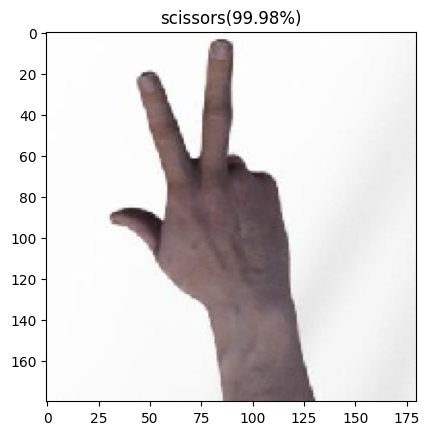

In [ ]:
plt.imshow(img)
plt.title(class_names[np.argmax(score)]+'('+str(round((100 * np.max(score)),2))+'%)')

1/1 [==============================] - 0s 18ms/step


Text(0.5, 1.0, 'rock(53.94%)')

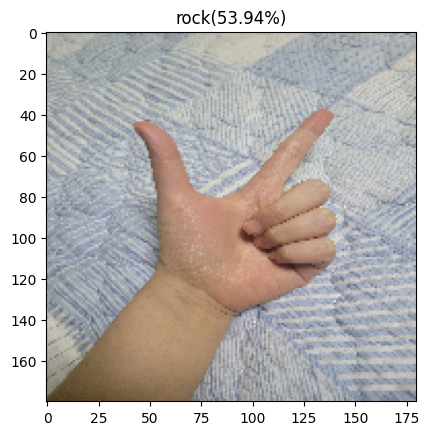

In [ ]:
img = tf.keras.utils.load_img(
    '/content/1.jpg', target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

plt.imshow(img)
plt.title(class_names[np.argmax(score)]+'('+str(round((100 * np.max(score)),2))+'%)')

1/1 [==============================] - 0s 19ms/step


Text(0.5, 1.0, 'paper(100.0%)')

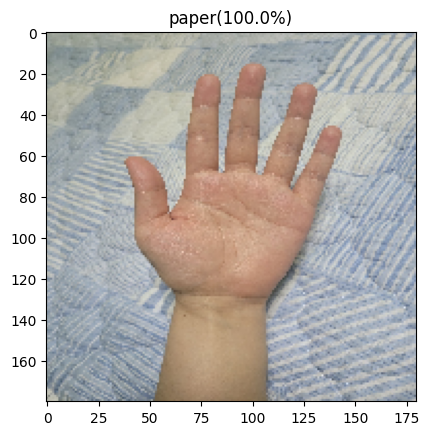

In [ ]:
img = tf.keras.utils.load_img(
    '/content/2.jpg', target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

plt.imshow(img)
plt.title(class_names[np.argmax(score)]+'('+str(round((100 * np.max(score)),2))+'%)')

1/1 [==============================] - 0s 20ms/step


Text(0.5, 1.0, 'paper(66.46%)')

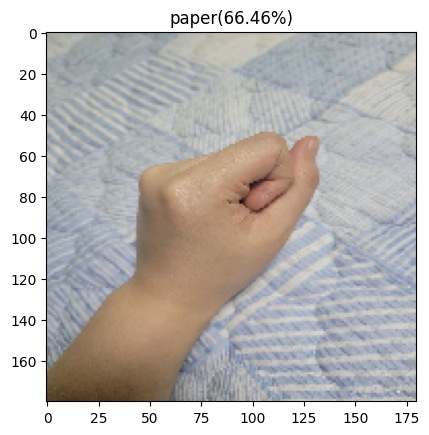

In [ ]:
img = tf.keras.utils.load_img(
    '/content/3.jpg', target_size=(img_height, img_width)
)
img_array = tf.keras.utils.img_to_array(img)
img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
score = tf.nn.softmax(predictions[0])

plt.imshow(img)
plt.title(class_names[np.argmax(score)]+'('+str(round((100 * np.max(score)),2))+'%)')

## PyTorch로 학습해보기

- PIL 버전 낮추기

In [ ]:
!pip install --upgrade pillow==6.2.2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.8/37.8 MB 12.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pillow: filename=Pillow-6.2.2-cp310-cp310-linux_x86_64.whl size=1067573 sha256=54ea5ae7cdad56e32c234255f31051d26fef9f42b72af06e21ffa788d038d4a7
  Stored in directory: /root/.cache/pip/wheels/4c/f0/14/4aa5f8e874837feee51602ab9acc027d9186e7f3cd6752cb89
Successfully built pillow
  Attempting uninstall: pillow
    Found existing installation: Pillow 8.4.0
    Uninstalling Pillow-8.4.0:
      Successfully uninstalled Pillow-8.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bokeh 3.1.1 requires pillow>=7.1.0, but you have pillow 6.2.2 which is incompatible.
dopamine-rl 4.0.6 requires Pillow>=7.0.0, but you have pillow 6.2.2 which is incompatible.
imageio 2.25.1 requires pillow>=8.3.2, but you have pillow 6.2.2 which is inco

### Torch 유틸리티를 사용하여 데이터 로드

In [ ]:
import numpy as np
import torch
from torch.utils.data import Dataset
from torchvision import datasets, transforms

- Device 설정

In [ ]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"

- batch_size, 이미지 크기 지정

In [ ]:
batch_size = 32
img_height = 180
img_width = 180

- training 데이터 셋 만들기

In [ ]:
train_dataset = datasets.ImageFolder(root='/content/Rock-Paper-Scissors-1/train',
                                    transform=transforms.Compose([
                                        transforms.Resize((img_height, img_width)),
                                        transforms.ToTensor(),
                                    ])
                                   )

- validation 데이터 셋 만들기

In [ ]:
valid_dataset = datasets.ImageFolder(root='/content/Rock-Paper-Scissors-1/valid',
                                    transform=transforms.Compose([
                                        transforms.Resize((img_height, img_width)),
                                        transforms.ToTensor(),
                                    ])
                                   )

- test 데이터 셋 만들기

In [ ]:
test_dataset = datasets.ImageFolder(root='/content/Rock-Paper-Scissors-1/test',
                                    transform=transforms.Compose([
                                        transforms.Resize((img_height, img_width)),
                                        transforms.ToTensor(),
                                    ])
                                   )

- DataLoader로 데이터 로드

In [ ]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
val_dataloader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

- class 이름 확인하기

In [ ]:
train_dataset.class_to_idx

{'paper': 0, 'rock': 1, 'scissors': 2}

- 데이터 시각화하기

In [ ]:
import matplotlib.pyplot as plt
labels_map = {v:k for k,v in train_dataset.class_to_idx.items()}
labels_map

{0: 'paper', 1: 'rock', 2: 'scissors'}

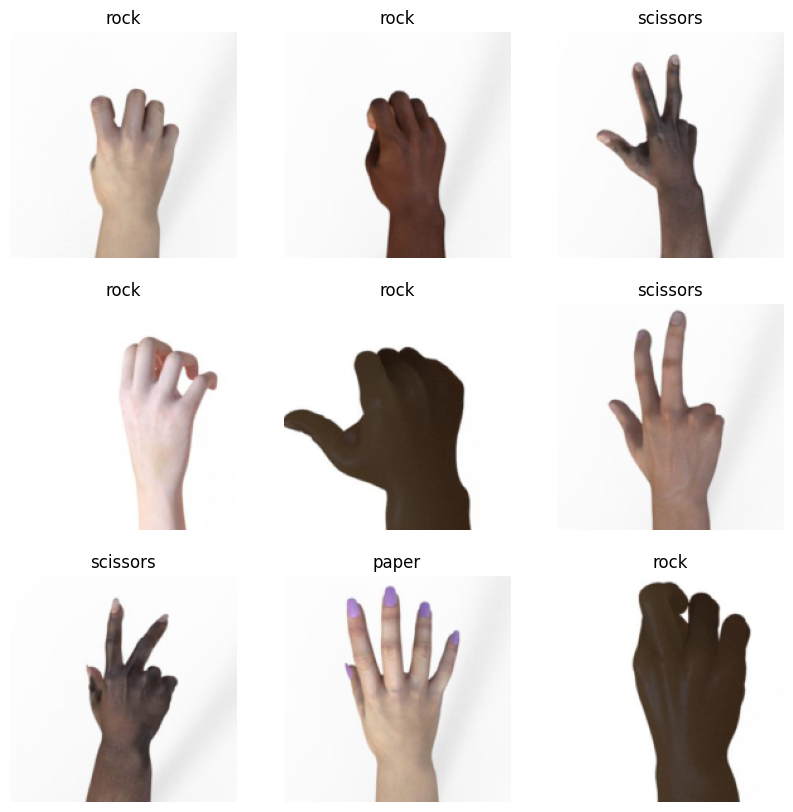

In [ ]:
figure = plt.figure(figsize=(10, 10))
cols, rows = 3, 3
for i in range(1, cols * rows + 1):
    sample_idx = torch.randint(len(train_dataset), size=(1,)).item()
    img, label = train_dataset[sample_idx]
    figure.add_subplot(rows, cols, i)
    plt.title(labels_map[label])
    plt.axis("off")
    plt.imshow(torch.permute(img, (1, 2, 0)))
plt.show()

- shape 확인하기

In [ ]:
images, labels = next(iter(train_dataloader))
images.shape, labels.shape

(torch.Size([32, 3, 180, 180]), torch.Size([32]))

### PyTorch로 모델 만들기

In [ ]:
import torch
from torch import nn
import torch.optim as optim

In [ ]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()

        self.sequential = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
            )
        self.fc1 = nn.Linear(30976, 128)
        self.fc2 = nn.Linear(128, 3)

    def forward(self, x):
        x = self.sequential(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = self.fc2(x)
        return x

In [ ]:
model = NeuralNetwork()
model = model.to(device)

- 모델 요약

In [ ]:
from torchsummary import summary
summary(model, (3, 180, 180))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 180, 180]             448
              ReLU-2         [-1, 16, 180, 180]               0
         MaxPool2d-3           [-1, 16, 90, 90]               0
            Conv2d-4           [-1, 32, 90, 90]           4,640
              ReLU-5           [-1, 32, 90, 90]               0
         MaxPool2d-6           [-1, 32, 45, 45]               0
            Conv2d-7           [-1, 64, 45, 45]          18,496
              ReLU-8           [-1, 64, 45, 45]               0
         MaxPool2d-9           [-1, 64, 22, 22]               0
           Linear-10                  [-1, 128]       3,965,056
           Linear-11                    [-1, 3]             387
Total params: 3,989,027
Trainable params: 3,989,027
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.37
Forw

- optimizer, loss 함수 설정

In [ ]:
optimizer = optim.Adam(model.parameters())
loss_fn = nn.CrossEntropyLoss().to(device)

- tensorboard에 학습과정 기록하기

In [ ]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

- epochs 설정 및 학습 결과 저장 리스트 생성

In [ ]:
epochs = 10

train_loss_history = []
train_accuracy_history= []
val_loss_history = []
val_accuracy_history = []

- 학습하기

In [ ]:
for t in range(epochs):
    #Training Loop
    train_loss, val_loss = 0, 0
    train_accuracy, val_accuracy = 0, 0
    print(f"Epoch {t+1}\n-------------------------------")
    train_size = len(train_dataloader.dataset)
    train_num_batches = len(train_dataloader)
    for batch, (X, y) in enumerate(train_dataloader):
        X = X.to(device)
        y = y.to(device)
        pred = model(X)
        loss = loss_fn(pred, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_accuracy += (pred.argmax(1) == y).type(torch.float).sum().item()

    train_loss /= train_num_batches
    train_loss_history.append(train_loss)
    writer.add_scalar('Training Loss',train_loss,t+1)

    train_accuracy /= train_size
    train_accuracy_history.append(train_accuracy)
    writer.add_scalar('Training Accuracy',train_accuracy,t+1)

    #Validation Loop
    val_size = len(val_dataloader.dataset)
    val_num_batches = len(val_dataloader)
    with torch.no_grad():
        for X, y in val_dataloader:
            X = X.to(device)
            y = y.to(device)
            pred = model(X)
            val_loss += loss_fn(pred, y).item()
            val_accuracy += (pred.argmax(1) == y).type(torch.float).sum().item()

    val_loss /= val_num_batches
    val_loss_history.append(val_loss)
    writer.add_scalar('Validation Loss',val_loss,t+1)

    val_accuracy /= val_size
    val_accuracy_history.append(val_accuracy)
    writer.add_scalar('Validation Accuracy',val_accuracy,t+1)

    #학습결과 출력
    print('training loss : {:4f}, training acc : {:4f}, validation loss : {:4f}, validation acc : {:4f}'.format(
        train_loss, train_accuracy, val_loss, val_accuracy))

Epoch 1
-------------------------------
training loss : 0.834850, training acc : 0.617460, validation loss : 0.626195, validation acc : 0.725806
Epoch 2
-------------------------------
training loss : 0.056982, training acc : 0.985714, validation loss : 1.018265, validation acc : 0.709677
Epoch 3
-------------------------------
training loss : 0.018219, training acc : 0.994841, validation loss : 1.118996, validation acc : 0.763441
Epoch 4
-------------------------------
training loss : 0.000864, training acc : 1.000000, validation loss : 1.128967, validation acc : 0.776882
Epoch 5
-------------------------------
training loss : 0.000302, training acc : 1.000000, validation loss : 1.208400, validation acc : 0.779570
Epoch 6
-------------------------------
training loss : 0.000177, training acc : 1.000000, validation loss : 1.188377, validation acc : 0.779570
Epoch 7
-------------------------------
training loss : 0.000125, training acc : 1.000000, validation loss : 1.261522, validation 

### 학습 결과 확인하기

- tensorboard로 학습 결과 출력

In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/runs' --port=7777

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

- 결과 살펴보기

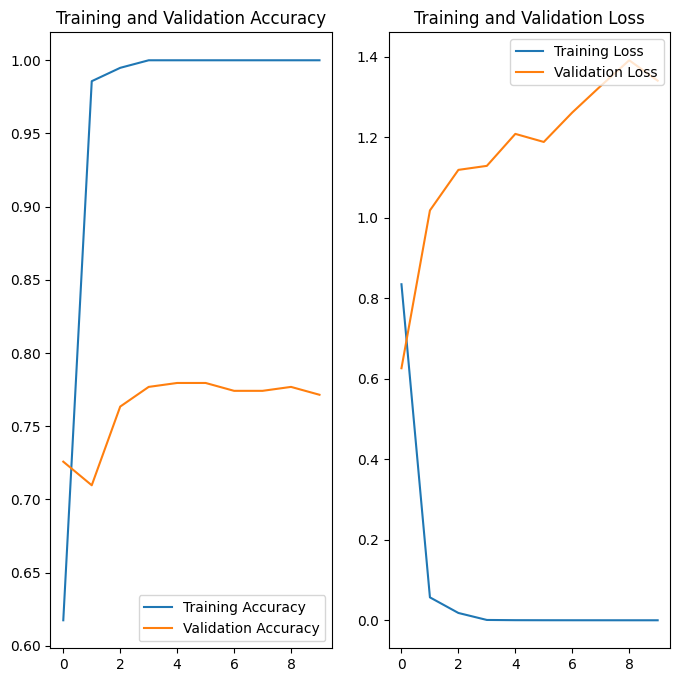

In [ ]:
epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_accuracy_history, label='Training Accuracy')
plt.plot(epochs_range, val_accuracy_history, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss_history, label='Training Loss')
plt.plot(epochs_range, val_loss_history, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

- 새로운 데이터로 모델 성능 확인하기

In [ ]:
from PIL import Image
import torch.nn.functional as F

In [ ]:
img =Image.open(
    './Rock-Paper-Scissors-1/test/scissors/scissors2_png.rf.2746f658ddbe0b240dd3f3d7f4926c01.jpg'
)
img = img.resize((img_height,img_width))
tf = transforms.ToTensor()
img_array = tf(img)
img_array  = img_array.to(device)

predictions = model(torch.unsqueeze(img_array, 0))
score = F.softmax(predictions,1)

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(labels_map[np.max(torch.argmax(score).to('cpu').numpy())],
            np.max((torch.max(score).to('cpu')).detach().numpy())* 100)
)

This image most likely belongs to paper with a 58.87 percent confidence.


In [ ]:
predictions

tensor([[ 2.9246, -6.0398,  2.5658]], device='cuda:0',
       grad_fn=<AddmmBackward0>)

In [ ]:
score

tensor([[5.8872e-01, 7.5283e-05, 4.1121e-01]], device='cuda:0',
       grad_fn=<SoftmaxBackward0>)

Text(0.5, 1.0, 'paper(58.87%)')

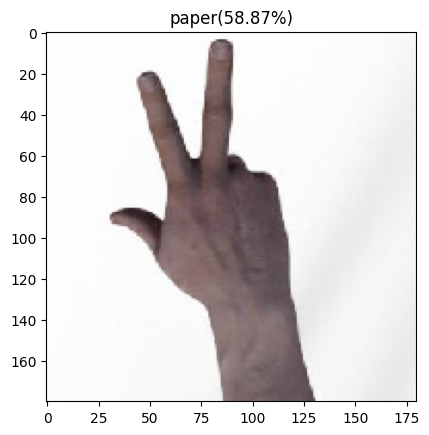

In [ ]:
plt.imshow(img)
plt.title(labels_map[np.max(torch.argmax(score).to('cpu').numpy())]+
          '('+str(round((np.max((torch.max(score).to('cpu')).detach().numpy())* 100),2))+'%)')

Text(0.5, 1.0, 'paper(89.84%)')

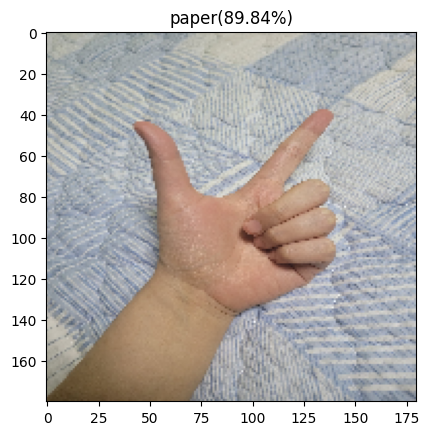

In [ ]:
img = Image.open('/content/1.jpg')
img = img.resize((img_height,img_width))
tf = transforms.ToTensor()
img_array = tf(img)
img_array  = img_array.to(device)

predictions = model(torch.unsqueeze(img_array, 0))
score = F.softmax(predictions,1)

plt.imshow(img)
plt.title(labels_map[np.max(torch.argmax(score).to('cpu').numpy())]+
          '('+str(round((np.max((torch.max(score).to('cpu')).detach().numpy())* 100),2))+'%)')

Text(0.5, 1.0, 'rock(99.98%)')

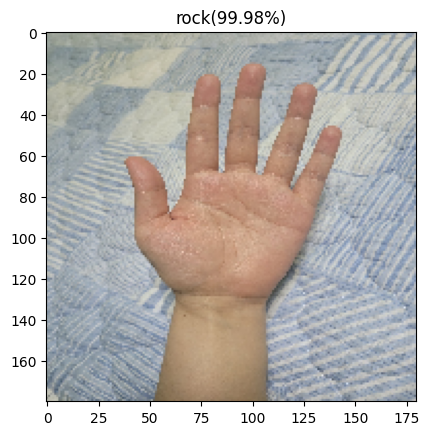

In [ ]:
img = Image.open('/content/2.jpg')
img = img.resize((img_height,img_width))
tf = transforms.ToTensor()
img_array = tf(img)
img_array  = img_array.to(device)

predictions = model(torch.unsqueeze(img_array, 0))
score = F.softmax(predictions,1)

plt.imshow(img)
plt.title(labels_map[np.max(torch.argmax(score).to('cpu').numpy())]+'('+str(round((np.max((torch.max(score).to('cpu')).detach().numpy())* 100),2))+'%)')

Text(0.5, 1.0, 'rock(92.44%)')

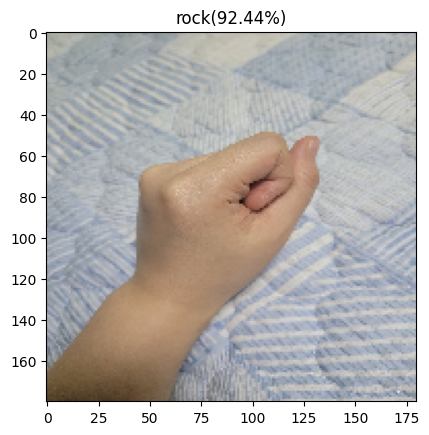

In [ ]:
img = Image.open('/content/3.jpg')
img = img.resize((img_height,img_width))
tf = transforms.ToTensor()
img_array = tf(img)
img_array  = img_array.to(device)

predictions = model(torch.unsqueeze(img_array, 0))
score = F.softmax(predictions,1)

plt.imshow(img)
plt.title(labels_map[np.max(torch.argmax(score).to('cpu').numpy())]+'('+str(round((np.max((torch.max(score).to('cpu')).detach().numpy())* 100),2))+'%)')

### Data augmentation

In [ ]:
from torchvision import datasets, transforms

- training 데이터 셋 만들기 (RandAugment적용)

In [ ]:
train_dataset = datasets.ImageFolder(root='/content/Rock-Paper-Scissors-1/train',
                                    transform=transforms.Compose([
                                        transforms.Resize((img_height, img_width)),
                                        transforms.RandAugment(num_ops=2,magnitude=9),
                                        transforms.ToTensor(),
                                    ])
                                   )

- RandAugment가 적용된 training 데이터 셋 살펴보기

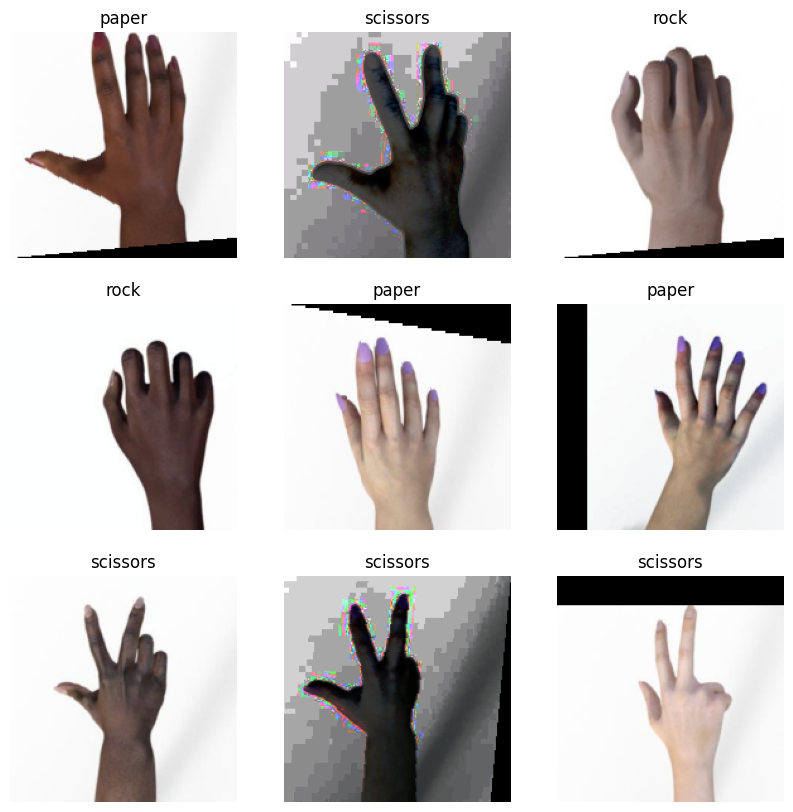

In [ ]:
figure = plt.figure(figsize=(10, 10))
cols, rows = 3, 3
for i in range(1, cols * rows + 1):
    sample_idx = torch.randint(len(train_dataset), size=(1,)).item()
    img, label = train_dataset[sample_idx]
    figure.add_subplot(rows, cols, i)
    plt.title(labels_map[label])
    plt.axis("off")
    plt.imshow(torch.permute(img, (1, 2, 0)))
plt.show()

- Dataloader로 데이터 로드

In [ ]:
from torch.utils.data import DataLoader

train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)

- 모델 만들기

In [ ]:
import torch
from torch import nn
import torch.optim as optim

In [ ]:
class NeuralNetwork(nn.Module):
    def __init__(self):
        super(NeuralNetwork, self).__init__()

        self.sequential = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(in_channels=16, out_channels=32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),
            nn.Conv2d(in_channels=32, out_channels=64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
            )
        self.fc1 = nn.Linear(30976, 128)
        self.fc2 = nn.Linear(128, 3)

    def forward(self, x):
        x = self.sequential(x)
        x = torch.flatten(x, 1)
        x = self.fc1(x)
        x = self.fc2(x)
        return x

In [ ]:
model = NeuralNetwork()
model = model.to(device)

- 모델 요약

In [ ]:
from torchsummary import summary
summary(model, (3, 180, 180))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 16, 180, 180]             448
              ReLU-2         [-1, 16, 180, 180]               0
         MaxPool2d-3           [-1, 16, 90, 90]               0
            Conv2d-4           [-1, 32, 90, 90]           4,640
              ReLU-5           [-1, 32, 90, 90]               0
         MaxPool2d-6           [-1, 32, 45, 45]               0
            Conv2d-7           [-1, 64, 45, 45]          18,496
              ReLU-8           [-1, 64, 45, 45]               0
         MaxPool2d-9           [-1, 64, 22, 22]               0
           Linear-10                  [-1, 128]       3,965,056
           Linear-11                    [-1, 3]             387
Total params: 3,989,027
Trainable params: 3,989,027
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.37
Forw

- optimizer, loss 함수 설정

In [ ]:
optimizer = optim.Adam(model.parameters())
loss_fn = nn.CrossEntropyLoss().to(device)

- tensorboard에 학습 결과 기록

In [ ]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

- epoch 설정 및 학습결과 저장을 위한 리스트 생성

In [ ]:
epochs = 15

train_loss_history = []
train_accuracy_history= []
val_loss_history = []
val_accuracy_history = []

- 학습하기

In [ ]:
for t in range(epochs):
    #Training Loop
    train_loss, val_loss = 0, 0
    train_accuracy, val_accuracy = 0, 0
    print(f"Epoch {t+1}\n-------------------------------")
    train_size = len(train_dataloader.dataset)
    train_num_batches = len(train_dataloader)
    for batch, (X, y) in enumerate(train_dataloader):
        X = X.to(device)
        y = y.to(device)
        pred = model(X)
        loss = loss_fn(pred, y)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        train_loss += loss.item()
        train_accuracy += (pred.argmax(1) == y).type(torch.float).sum().item()

    train_loss /= train_num_batches
    train_loss_history.append(train_loss)
    writer.add_scalar('Training Loss',train_loss,t+1)

    train_accuracy /= train_size
    train_accuracy_history.append(train_accuracy)
    writer.add_scalar('Training Accuracy',train_accuracy,t+1)

    #Validation Loop
    val_size = len(val_dataloader.dataset)
    val_num_batches = len(val_dataloader)
    with torch.no_grad():
        for X, y in val_dataloader:
            X = X.to(device)
            y = y.to(device)
            pred = model(X)
            val_loss += loss_fn(pred, y).item()
            val_accuracy += (pred.argmax(1) == y).type(torch.float).sum().item()

    val_loss /= val_num_batches
    val_loss_history.append(val_loss)
    writer.add_scalar('Validation Loss',val_loss,t+1)

    val_accuracy /= val_size
    val_accuracy_history.append(val_accuracy)
    writer.add_scalar('Validation Accuracy',val_accuracy,t+1)

    #학습결과 출력
    print('training loss : {:4f}, training acc : {:4f}, validation loss : {:4f}, validation acc : {:4f}'.format(
        train_loss, train_accuracy, val_loss, val_accuracy))

Epoch 1
-------------------------------
training loss : 1.098474, training acc : 0.433333, validation loss : 0.972019, validation acc : 0.626344
Epoch 2
-------------------------------
training loss : 0.557585, training acc : 0.783333, validation loss : 0.381596, validation acc : 0.903226
Epoch 3
-------------------------------
training loss : 0.273248, training acc : 0.905556, validation loss : 0.171721, validation acc : 0.951613
Epoch 4
-------------------------------
training loss : 0.157792, training acc : 0.949603, validation loss : 0.164155, validation acc : 0.916667
Epoch 5
-------------------------------
training loss : 0.140323, training acc : 0.957143, validation loss : 0.176452, validation acc : 0.935484
Epoch 6
-------------------------------
training loss : 0.094644, training acc : 0.968254, validation loss : 0.132668, validation acc : 0.946237
Epoch 7
-------------------------------
training loss : 0.098677, training acc : 0.969444, validation loss : 0.215012, validation 

- 학습 결과 살펴보기

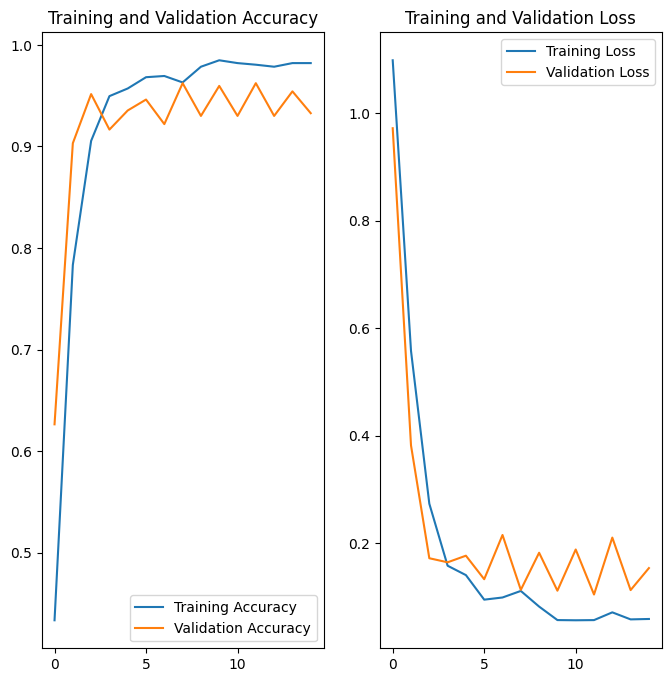

In [ ]:
epochs_range = range(epochs)

plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, train_accuracy_history, label='Training Accuracy')
plt.plot(epochs_range, val_accuracy_history, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, train_loss_history, label='Training Loss')
plt.plot(epochs_range, val_loss_history, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

- 새로운 데이터로 모델 테스트 해보기

In [ ]:
from PIL import Image
import torch.nn.functional as F

img =Image.open(
    './Rock-Paper-Scissors-1/test/scissors/scissors2_png.rf.2746f658ddbe0b240dd3f3d7f4926c01.jpg'
)
img = img.resize((img_height,img_width))
tf = transforms.ToTensor()
img_array = tf(img)
img_array  = img_array.to(device)

predictions = model(torch.unsqueeze(img_array, 0))
score = F.softmax(predictions,1)

print(
    "This image most likely belongs to {} with a {:.2f} percent confidence."
    .format(labels_map[np.max(torch.argmax(score).to('cpu').numpy())],
            np.max((torch.max(score).to('cpu')).detach().numpy())* 100)
)

This image most likely belongs to scissors with a 100.00 percent confidence.


Text(0.5, 1.0, 'scissors(100.0%)')

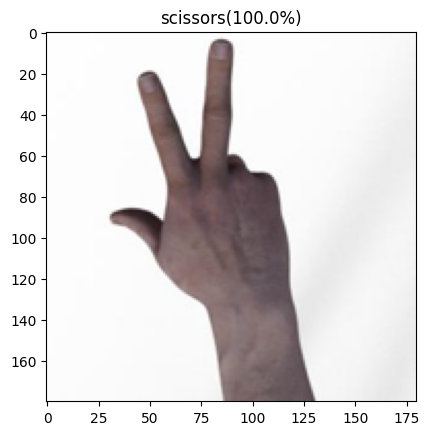

In [ ]:
plt.imshow(img)
plt.title(labels_map[np.max(torch.argmax(score).to('cpu').numpy())]+
          '('+str(round((np.max((torch.max(score).to('cpu')).detach().numpy())* 100),2))+'%)')

Text(0.5, 1.0, 'scissors(81.49%)')

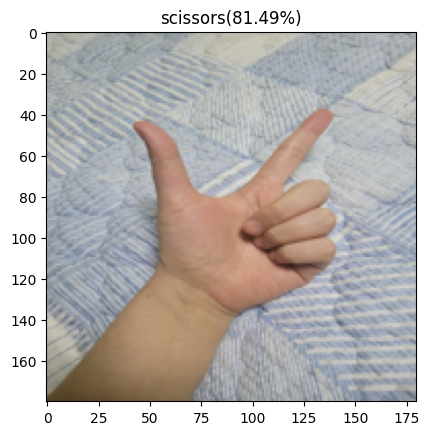

In [ ]:
img = Image.open('/content/1.jpg')
img = img.resize((img_height,img_width))
tf = transforms.ToTensor()
img_array = tf(img)
img_array  = img_array.to(device)

predictions = model(torch.unsqueeze(img_array, 0))
score = F.softmax(predictions,1)

plt.imshow(img)
plt.title(labels_map[np.max(torch.argmax(score).to('cpu').numpy())]+
          '('+str(round((np.max((torch.max(score).to('cpu')).detach().numpy())* 100),2))+'%)')

Text(0.5, 1.0, 'paper(96.88%)')

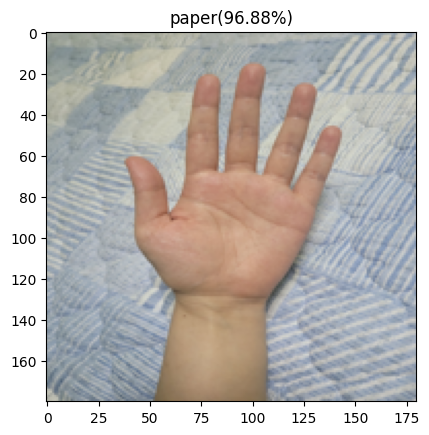

In [ ]:
img = Image.open('/content/2.jpg')
img = img.resize((img_height,img_width))
tf = transforms.ToTensor()
img_array = tf(img)
img_array  = img_array.to(device)

predictions = model(torch.unsqueeze(img_array, 0))
score = F.softmax(predictions,1)

plt.imshow(img)
plt.title(labels_map[np.max(torch.argmax(score).to('cpu').numpy())]+
          '('+str(round((np.max((torch.max(score).to('cpu')).detach().numpy())* 100),2))+'%)')

Text(0.5, 1.0, 'rock(99.55%)')

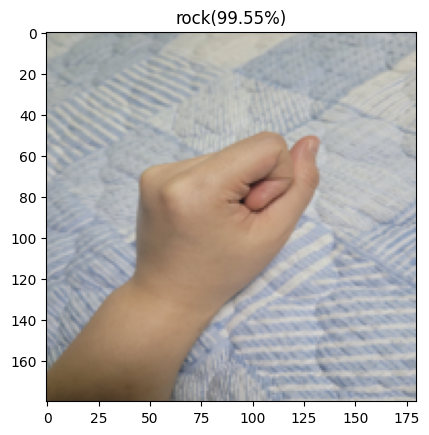

In [ ]:
img = Image.open('/content/3.jpg')
img = img.resize((img_height,img_width))
tf = transforms.ToTensor()
img_array = tf(img)
img_array  = img_array.to(device)

predictions = model(torch.unsqueeze(img_array, 0))
score = F.softmax(predictions,1)

plt.imshow(img)
plt.title(labels_map[np.max(torch.argmax(score).to('cpu').numpy())]+
          '('+str(round((np.max((torch.max(score).to('cpu')).detach().numpy())* 100),2))+'%)')